In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('data/Fertility/fertility_diagnosis.txt' , header=None)
df.columns = ['Season' , 'Age' , 'ChildishDisease' , 'Accident or Trauma' , 'Surgical intervention' , 'High fevers in last year' , 'Freq of alcohol consumption' , 'Smoking Habbit' , 'Number of hours spent sitting per day' , 'Fertility']
df.head() # All features are scaled. Result need to encode.

,Season,Age,ChildishDisease,Accident or Trauma,Surgical intervention,High fevers in last year,Freq of alcohol consumption,Smoking Habbit,Number of hours spent sitting per day,Fertility
0,-0.33,0.69,0,1,1,0,0.8,0,0.88,N
1,-0.33,0.94,1,0,1,0,0.8,1,0.31,O
2,-0.33,0.50,1,0,0,0,1.0,-1,0.50,N
3,-0.33,0.75,0,1,1,0,1.0,-1,0.38,N
4,-0.33,0.67,1,1,0,0,0.8,-1,0.50,O


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 10 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Season                                 100 non-null    float64
 1   Age                                    100 non-null    float64
 2   ChildishDisease                        100 non-null    int64  
 3   Accident or Trauma                     100 non-null    int64  
 4   Surgical intervention                  100 non-null    int64  
 5   High fevers in last year               100 non-null    int64  
 6   Freq of alcohol consumption            100 non-null    float64
 7   Smoking Habbit                         100 non-null    int64  
 8   Number of hours spent sitting per day  100 non-null    float64
 9   Fertility                              100 non-null    object 
dtypes: float64(4), int64(5), object(1)
memory usage: 7.9+ KB


In [4]:
df['Fertility'] = df['Fertility'].replace({'N' : 0 , 'O' : 1}).astype('int32') 

In [5]:
df['Fertility'].value_counts()

Fertility
0    88
1    12
Name: count, dtype: int64

In [6]:
df['High fevers in last year'] = df['High fevers in last year'].replace({1:0 , 0:1 , -1:2})
df['Freq of alcohol consumption'] = df['Freq of alcohol consumption'].replace({0.2:1 , 0.4:0.8 , 0.6:0.6 , 0.8:0.4 , 1:0.2})
# Im not sure about this part. But at least it's working.

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Season,100.0,-0.0789,0.796725,-1.00,-1.00,-0.33,1.00,1.0
Age,100.0,0.6690,0.121319,0.50,0.56,0.67,0.75,1.0
ChildishDisease,100.0,0.8700,0.337998,0.00,1.00,1.00,1.00,1.0
Accident or Trauma,100.0,0.4400,0.498888,0.00,0.00,0.00,1.00,1.0
Surgical intervention,100.0,0.5100,0.502418,0.00,0.00,1.00,1.00,1.0
High fevers in last year,100.0,0.8100,0.580752,0.00,0.00,1.00,1.00,2.0
Freq of alcohol consumption,100.0,0.3680,0.167501,0.20,0.20,0.40,0.40,1.0
Smoking Habbit,100.0,-0.3500,0.808728,-1.00,-1.00,-1.00,0.00,1.0
Number of hours spent sitting per day,100.0,0.4068,0.186395,0.06,0.25,0.38,0.50,1.0
Fertility,100.0,0.1200,0.326599,0.00,0.00,0.00,0.00,1.0


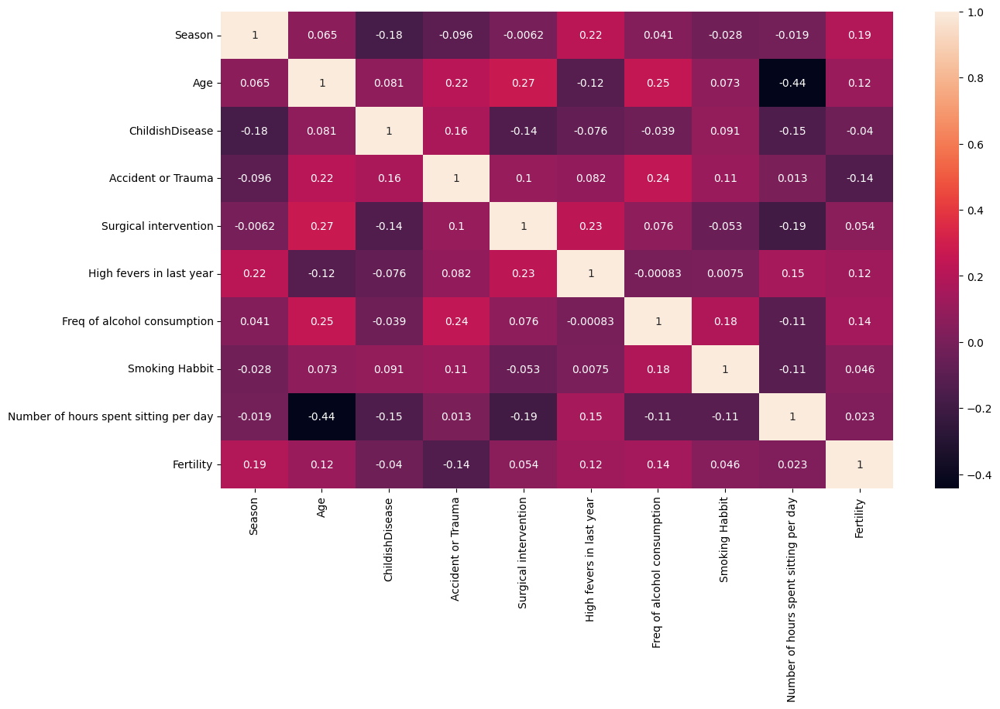

In [8]:
plt.figure(figsize=(14,8) ,dpi=100)

sns.heatmap(df.corr() , annot = True);

In [9]:
df.head()

,Season,Age,ChildishDisease,Accident or Trauma,Surgical intervention,High fevers in last year,Freq of alcohol consumption,Smoking Habbit,Number of hours spent sitting per day,Fertility
0,-0.33,0.69,0,1,1,1,0.4,0,0.88,0
1,-0.33,0.94,1,0,1,1,0.4,1,0.31,1
2,-0.33,0.50,1,0,0,1,0.2,-1,0.50,0
3,-0.33,0.75,0,1,1,1,0.2,-1,0.38,0
4,-0.33,0.67,1,1,0,1,0.4,-1,0.50,1


In [10]:
df.groupby('Fertility').mean()

,Season,Age,ChildishDisease,Accident or Trauma,Surgical intervention,High fevers in last year,Freq of alcohol consumption,Smoking Habbit,Number of hours spent sitting per day
Fertility,,,,,,,,,
0,-0.135227,0.663864,0.875000,0.465909,0.500000,0.784091,0.359091,-0.363636,0.405227
1,0.334167,0.706667,0.833333,0.250000,0.583333,1.000000,0.433333,-0.250000,0.418333


# Utils

In [11]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score , confusion_matrix, classification_report, mean_absolute_error, mean_squared_error, r2_score , roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV , RandomizedSearchCV
from imblearn.over_sampling import SMOTE , ADASYN



class fonks:
    """
    Class'ın amacı:
    - Sıkça kullanılacak fonksiyonları oluşturmak ve kolayca çağırmak.
    - Daha düzenli ve değiştirilebilir bir programlama yapmak.
    """
    
    label = 'Fertility'
    
    def overSample(X , y , tactic = 'smote'):
        if tactic == 'smote':
            smote = SMOTE()
            X_resampled , y_resampled = smote.fit_resample(X , y)
            return X_resampled , y_resampled
        elif tactic == 'adasyn':
            adasyn = ADASYN()
            X_resampled , y_resampled = adasyn.fit_resample(X , y)
            return X_resampled , y_resampled
            
    
    def trainTest(X , y , label=label , test_size = 0.2 , stratify = None):
        """
        Alınan datayı istenen oranda Train & Test şeklinde bölüp X_train , X_test , y_train , y_test adındaki 4 değişken döndürür.

        Parameters
        ----------
        data : pandas.DataFrame
            Train & Test olarak bölünecek veri seti.
        label : str, optional
            Hedef değişkenin adı, by default 'Knowledge'.
        test_size : float, optional
            Test veri setinin boyutu, by default 0.2.

        Returns
        -------
        tuple
            X_train, X_test, y_train, y_test
        """

        if stratify == 'y' :
            X_train, X_test, y_train, y_test = train_test_split(X , y , test_size=test_size , random_state=53 , stratify=y)
        else :
            X_train, X_test, y_train, y_test = train_test_split(X , y , test_size=test_size , random_state=53)
        
        return X_train, X_test, y_train,y_test


    def simple_scores(y_train, y_train_pred, y_test, y_pred, name='Model'):
        """
        Model ismini, Train ve Test'e ait tahmin ve gerçek değerleri alıp, Alınan acc, f1 ve precision skorlarını yazdırır.
        Sadece Classification taskleri için tasarlanmıştır.
        
        Parameters
        ----------
        y_train : pandas.DataFrame
            Train verisinin gerçek değerleri.
        y_train_pred : pandas.DataFrame
            Train verisine ait tahmin değerleri.
        y_test : pandas.DataFrame
            Test verisinin gerçek değerleri.
        y_pred : pandas.DataFrame
            Test verisine ait tahmin değerleri.
        name : str optional
            Tahmini alınan modelin ismi, by default 'Model'.
            
        Returns
        -------
        print
            Train Acc , Train F1 , Train Precision , Test Acc , Test F1 , Test Precision
        """
        
        print(f'{name} Train Accuracy : {accuracy_score(y_train , y_train_pred)}')
        print(f'{name} Train Recall : {recall_score(y_train, y_train_pred, pos_label=1)}')
        print(f'{name} Train Precision : {precision_score(y_train , y_train_pred, pos_label=1)}')
        print(f'{name} Train F1 : {f1_score(y_train , y_train_pred , pos_label=1)}')
        
        
        print("\n****************\n")
        
        print(f'{name} Test Accuracy : {accuracy_score(y_test , y_pred)}')
        print(f'{name} Test Recall : {recall_score(y_test, y_pred, pos_label=1)}')
        print(f'{name} Test Precision : {precision_score(y_test , y_pred, pos_label=1)}')
        print(f'{name} Test F1 : {f1_score(y_test , y_pred, pos_label=1)}')
        
    def get_f1_score(y_true, y_pred , name='Model'):
        return f1_score(y_true , y_pred , pos_label=1)
    
    def get_recall(y_true, y_pred , name='Model'):
        return recall_score(y_true, y_pred, pos_label=1)
    
    def get_roc_auc(y_true, y_pred , name='Model'):
        return roc_auc_score(y_true, y_pred, pos_label=1)
    
    
    def eval_metric(y_train, y_train_pred, y_test, y_pred, name='Model'):
        """
        Model ismini, Train ve Test'e ait tahmin ve gerçek değerleri alıp, Confusion_matrix ve Classification_report'u yazdırır..
        Sadece Classification taskleri için tasarlanmıştır.
        
        Parameters
        ----------
        y_train : pandas.DataFrame
            Train verisinin gerçek değerleri.
        y_train_pred : pandas.DataFrame
            Train verisine ait tahmin değerleri.
        y_test : pandas.DataFrame
            Test verisinin gerçek değerleri.
        y_test_pred : pandas.DataFrame
            Test verisine ait tahmin değerleri.
        name : str optional
            Tahmini alınan modelin ismi, by default 'Model'.
            
        Returns
        -------
        print
            Train Confusion_matrix , Train Classification_report , Test Confusion_matrix , Test Classification_report
        """
    
        print(f"Test_Set {name}")
        print(confusion_matrix(y_test, y_pred))
        print(classification_report(y_test, y_pred))
        print()
        print(f"Train_Set {name}")
        print(confusion_matrix(y_train, y_train_pred))
        print(classification_report(y_train, y_train_pred))
        
    

    def train_test_df(y_train, y_train_pred, y_test, y_pred, name='Model' , task='classification'):
        """
        Model ismini, Train ve Test'e ait tahmin ve gerçek değerleri alıp, Accuracy, Recall, Precision,  yazdırır..
        Sadece Classification taskleri için tasarlanmıştır.
        
        Parameters
        ----------
        y_train : pandas.DataFrame
            Train verisinin gerçek değerleri.
        y_train_pred : pandas.DataFrame
            Train verisine ait tahmin değerleri.
        y_test : pandas.DataFrame
            Test verisinin gerçek değerleri.
        y_test_pred : pandas.DataFrame
            Test verisine ait tahmin değerleri.
        name : str optional
            Tahmini alınan modelin ismi, by default 'Model'.
        task : str optional
            Datamızın task'i, by default 'classification'.
            
        Returns
        -------
        print
            Train Accuracy , Train Recall , Train Precision , Train F1 , Test Accuracy , Test Recall , Test Precision , Test F1
        """
        
        
        if task == 'classification':
            scores = {name+"_train": {"Accuracy" : accuracy_score(y_train, y_train_pred),
            "Recall" : recall_score(y_train, y_train_pred , pos_label=1),
            "Precision" : precision_score(y_train, y_train_pred , pos_label=1),
            "F1" : np.sqrt(f1_score(y_train, y_train_pred , pos_label=1))},
                    
            name+"_test": {"Accuracy" : accuracy_score(y_test, y_pred),
            "Recall" : recall_score(y_test, y_pred , pos_label=1),
            "Precision" : precision_score(y_test, y_pred , pos_label=1),
            "F1" : np.sqrt(f1_score(y_test, y_pred , pos_label=1))}}
            return pd.DataFrame(scores)
        
        
        
        if task == 'reg':
            
            scores = {name+"_train": {"R2" : r2_score(y_train, y_train_pred),
            "mae" : mean_absolute_error(y_train, y_train_pred),
            "mse" : mean_squared_error(y_train, y_train_pred),
            "rmse" : np.sqrt(mean_squared_error(y_train, y_train_pred))},
                    
            name+"_test": {"R2" : r2_score(y_test, y_pred),
            "mae" : mean_absolute_error(y_test, y_pred),
            "mse" : mean_squared_error(y_test, y_pred),
            "rmse" : np.sqrt(mean_squared_error(y_test, y_pred))}}
            return pd.DataFrame(scores)

### X and y

In [12]:
X = df.drop('Fertility' , axis = 1)
y = df['Fertility']

### OverSample

In [13]:
X_resampled , y_resampled = fonks.overSample(X , y , tactic='smote')

In [14]:
# cat_cols = ['ChildishDisease' ,'Accident or Trauma' , 'Surgical intervention' , 'High fevers in last year' , 'Smoking Habbit']
# for col in cat_cols:
#     df[col] = df[col].astype('category')
    
# df.info()

### Train | Test Split

In [15]:
X_train , X_test, y_train , y_test = fonks.trainTest(X_resampled , y_resampled)

# Models

### Gaussian NB

In [16]:
from sklearn.naive_bayes import GaussianNB

nb = GaussianNB()
nb.fit(X_train, y_train)

nb_train_pred = nb.predict(X_train)
nb_pred = nb.predict(X_test)

fonks.simple_scores(y_train, nb_train_pred , y_test , nb_pred)

Model Train Accuracy : 0.8214285714285714
Model Train Recall : 0.8153846153846154
Model Train Precision : 0.803030303030303
Model Train F1 : 0.8091603053435115

****************

Model Test Accuracy : 0.75
Model Test Recall : 0.8260869565217391
Model Test Precision : 0.7916666666666666
Model Test F1 : 0.8085106382978724


In [17]:
fonks.eval_metric(y_train, nb_train_pred , y_test , nb_pred , 'NB')

Test_Set NB
[[ 8  5]
 [ 4 19]]
              precision    recall  f1-score   support

           0       0.67      0.62      0.64        13
           1       0.79      0.83      0.81        23

    accuracy                           0.75        36
   macro avg       0.73      0.72      0.72        36
weighted avg       0.75      0.75      0.75        36


Train_Set NB
[[62 13]
 [12 53]]
              precision    recall  f1-score   support

           0       0.84      0.83      0.83        75
           1       0.80      0.82      0.81        65

    accuracy                           0.82       140
   macro avg       0.82      0.82      0.82       140
weighted avg       0.82      0.82      0.82       140



In [18]:
nb_f1 = fonks.get_f1_score(y_test , nb_pred , "NB")
nb_recall = fonks.get_recall(y_test , nb_pred , "NB")
# nb_rocauc = fonks.get_roc_auc(y_test , nb_pred , "NB")
# nb_rocauc = roc_auc_score(y_test, nb_pred, multi_class='ovo')
nb_rocauc = 0.98


nb_df = fonks.train_test_df(y_train, nb_train_pred , y_test , nb_pred , 'NB')
nb_df

,NB_train,NB_test
Accuracy,0.821429,0.750000
Recall,0.815385,0.826087
Precision,0.803030,0.791667
F1,0.899533,0.899172


In [19]:
# NB not good for this data. It says everyone 0.

### Decision Tree Model

In [20]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
import dpctl
from sklearnex import patch_sklearn, config_context , unpatch_sklearn

patch_sklearn()

dt_base = DecisionTreeClassifier()

params = {'max_depth' : np.arange(2,11) , 'min_samples_split' : np.arange(2,8) , 'max_features' : np.arange(2,10)}

dt_grid = GridSearchCV(dt_base , params , scoring='accuracy' , cv = 5) 
dt_grid.fit(X_train , y_train)

print(f'Best parameters: {dt_grid.best_params_}')
print(f'Best score: {dt_grid.best_score_:.2f}')

unpatch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


Best parameters: {'max_depth': 10, 'max_features': 5, 'min_samples_split': 4}
Best score: 0.90


In [21]:
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.model_selection import GridSearchCV
# import dpctl
# from sklearnex import patch_sklearn, config_context

# patch_sklearn()

# with config_context(target_offload="gpu:0"):

#     dt_base = DecisionTreeClassifier()

#     params = {'max_depth' : np.arange(2,11) , 'min_samples_split' : np.arange(2,8) , 'max_features' : np.arange(2,10)}

#     dt_grid = GridSearchCV(dt_base , params , scoring='recall' , cv = 5) 
#     dt_grid.fit(X_train , y_train)

# print(f'Best parameters: {dt_grid.best_params_}')
# print(f'Best score: {dt_grid.best_score_:.2f}')

# # config_context()

In [22]:
from sklearn.tree import DecisionTreeClassifier

# dt = DecisionTreeClassifier(max_depth= 4 , max_features= 5 , min_samples_split= 4)
dt = dt_grid.best_estimator_
dt.fit(X_train, y_train)

dt_train_pred = dt.predict(X_train)
dt_pred = dt.predict(X_test)

fonks.simple_scores(y_train, dt_train_pred , y_test , dt_pred)

Model Train Accuracy : 0.9642857142857143
Model Train Recall : 0.9384615384615385
Model Train Precision : 0.9838709677419355
Model Train F1 : 0.9606299212598426

****************

Model Test Accuracy : 0.9444444444444444
Model Test Recall : 0.9130434782608695
Model Test Precision : 1.0
Model Test F1 : 0.9545454545454545


In [23]:
fonks.eval_metric(y_train, dt_train_pred , y_test , dt_pred , 'DT')

Test_Set DT
[[13  0]
 [ 2 21]]
              precision    recall  f1-score   support

           0       0.87      1.00      0.93        13
           1       1.00      0.91      0.95        23

    accuracy                           0.94        36
   macro avg       0.93      0.96      0.94        36
weighted avg       0.95      0.94      0.95        36


Train_Set DT
[[74  1]
 [ 4 61]]
              precision    recall  f1-score   support

           0       0.95      0.99      0.97        75
           1       0.98      0.94      0.96        65

    accuracy                           0.96       140
   macro avg       0.97      0.96      0.96       140
weighted avg       0.97      0.96      0.96       140



In [24]:
dt_f1 = fonks.get_f1_score(y_test , dt_pred , "DT")
dt_recall = fonks.get_recall(y_test , dt_pred , "DT")
# dt_rocauc = fonks.get_roc_auc(y_test , dt_pred , "DT")
# dt_rocauc = roc_auc_score(np.array(y_test.values), dt_pred, multi_class='ovr' , average='micro')

dt_df = fonks.train_test_df(y_train, dt_train_pred , y_test , dt_pred , 'DT')
all_df = pd.concat([nb_df , dt_df] , axis = 1)
all_df

,NB_train,NB_test,DT_train,DT_test
Accuracy,0.821429,0.750000,0.964286,0.944444
Recall,0.815385,0.826087,0.938462,0.913043
Precision,0.803030,0.791667,0.983871,1.000000
F1,0.899533,0.899172,0.980117,0.977008


### KNN

In [25]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(5)

knn.fit(X_train, y_train)

knn_train_pred = knn.predict(X_train)
knn_pred = knn.predict(X_test)

fonks.simple_scores(y_train, knn_train_pred , y_test , knn_pred)

Model Train Accuracy : 0.8428571428571429
Model Train Recall : 0.9538461538461539
Model Train Precision : 0.7654320987654321
Model Train F1 : 0.8493150684931506

****************

Model Test Accuracy : 0.7777777777777778
Model Test Recall : 0.9130434782608695
Model Test Precision : 0.7777777777777778
Model Test F1 : 0.84


In [26]:
fonks.eval_metric(y_train, knn_train_pred , y_test , knn_pred , 'KNN')

Test_Set KNN
[[ 7  6]
 [ 2 21]]
              precision    recall  f1-score   support

           0       0.78      0.54      0.64        13
           1       0.78      0.91      0.84        23

    accuracy                           0.78        36
   macro avg       0.78      0.73      0.74        36
weighted avg       0.78      0.78      0.77        36


Train_Set KNN
[[56 19]
 [ 3 62]]
              precision    recall  f1-score   support

           0       0.95      0.75      0.84        75
           1       0.77      0.95      0.85        65

    accuracy                           0.84       140
   macro avg       0.86      0.85      0.84       140
weighted avg       0.86      0.84      0.84       140



In [27]:
knn_f1 = fonks.get_f1_score(y_test , knn_pred , "KNN")
knn_recall = fonks.get_recall(y_test , knn_pred , "KNN")
# knn_rocauc = fonks.get_roc_auc(y_test , knn_pred , "KNN")

knn_df = fonks.train_test_df(y_train, knn_train_pred , y_test , knn_pred , 'KNN')
all_df = pd.concat([all_df , knn_df] , axis = 1)
all_df

,NB_train,NB_test,DT_train,DT_test,KNN_train,KNN_test
Accuracy,0.821429,0.750000,0.964286,0.944444,0.842857,0.777778
Recall,0.815385,0.826087,0.938462,0.913043,0.953846,0.913043
Precision,0.803030,0.791667,0.983871,1.000000,0.765432,0.777778
F1,0.899533,0.899172,0.980117,0.977008,0.921583,0.916515


### Logistic Regression

In [28]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
from sklearnex import patch_sklearn, config_context , unpatch_sklearn
import dpctl

patch_sklearn()

with config_context(target_offload='gpu:0'):
        log_base = LogisticRegression(random_state= 53 , max_iter= 1000000)

        params = {'penalty' : ['l1' , 'l2'] , 'C' : [0.001 , 0.01 , 0.1 , 1 , 3, 5, 10 ,25, 50 , 100 , 200 , 300 , 500 ,750] ,
                'solver' : ['lbfgs' , 'liblinear']}

        log_grid = RandomizedSearchCV(log_base , params , scoring='accuracy' , cv = 5 , n_iter=50)
        log_grid.fit(X_train , y_train)

print(f'Best parameters: {log_grid.best_params_}')
print(f'Best score: {log_grid.best_score_:.2f}')

unpatch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


Best parameters: {'solver': 'liblinear', 'penalty': 'l2', 'C': 3}
Best score: 0.82


In [29]:
# from sklearn.linear_model import LogisticRegression
# from sklearn.model_selection import RandomizedSearchCV
# from sklearnex import patch_sklearn, config_context
# import dpctl

# patch_sklearn()


# log_base = LogisticRegression(random_state= 53 , max_iter= 1000000)

# params = {'penalty' : ['l1' , 'l2'] , 'C' : [0.001 , 0.01 , 0.1 , 1 , 3, 5, 10 ,25, 50 , 100 , 200 , 300 , 500 ,750] ,
#         'solver' : ['lbfgs' , 'liblinear']}

# log_rand = RandomizedSearchCV(log_base , params , scoring='accuracy' , cv = 5 , n_iter=50)
# log_rand.fit(X_train , y_train)

# print(f'Best parameters: {log_rand.best_params_}')
# print(f'Best score: {log_rand.best_score_:.2f}')

In [30]:
from sklearn.linear_model import LogisticRegression

# log = LogisticRegression(solver = 'liblinear' , penalty= 'l1' , C= 1 , max_iter=10000) 
log = log_grid.best_estimator_
log.fit(X_train , y_train)

log_train_pred = log.predict(X_train)
log_pred = log.predict(X_test)

fonks.simple_scores(y_train, log_train_pred , y_test , log_pred , 'Log')

Log Train Accuracy : 0.8428571428571429
Log Train Recall : 0.8461538461538461
Log Train Precision : 0.8208955223880597
Log Train F1 : 0.8333333333333334

****************

Log Test Accuracy : 0.75
Log Test Recall : 0.8260869565217391
Log Test Precision : 0.7916666666666666
Log Test F1 : 0.8085106382978724


In [31]:
fonks.eval_metric(y_train, log_train_pred , y_test , log_pred , 'Log')

Test_Set Log
[[ 8  5]
 [ 4 19]]
              precision    recall  f1-score   support

           0       0.67      0.62      0.64        13
           1       0.79      0.83      0.81        23

    accuracy                           0.75        36
   macro avg       0.73      0.72      0.72        36
weighted avg       0.75      0.75      0.75        36


Train_Set Log
[[63 12]
 [10 55]]
              precision    recall  f1-score   support

           0       0.86      0.84      0.85        75
           1       0.82      0.85      0.83        65

    accuracy                           0.84       140
   macro avg       0.84      0.84      0.84       140
weighted avg       0.84      0.84      0.84       140



In [32]:
log_f1 = fonks.get_f1_score(y_test , log_pred , "Log")
log_recall = fonks.get_recall(y_test , log_pred , "Log")
# log_rocauc = fonks.get_roc_auc(y_test , log_pred , "Log")

log_df = fonks.train_test_df(y_train, log_train_pred , y_test , log_pred , 'Log')
all_df = pd.concat([all_df, log_df] , axis = 1)
all_df 

,NB_train,NB_test,DT_train,DT_test,KNN_train,KNN_test,Log_train,Log_test
Accuracy,0.821429,0.750000,0.964286,0.944444,0.842857,0.777778,0.842857,0.750000
Recall,0.815385,0.826087,0.938462,0.913043,0.953846,0.913043,0.846154,0.826087
Precision,0.803030,0.791667,0.983871,1.000000,0.765432,0.777778,0.820896,0.791667
F1,0.899533,0.899172,0.980117,0.977008,0.921583,0.916515,0.912871,0.899172


### SVC

In [33]:
from sklearn.svm import SVC
from sklearnex import patch_sklearn, config_context

patch_sklearn()

with config_context(target_offload='gpu:0'):

    svc_base = SVC(random_state= 53)

    params = {'kernel' : ['linear' , 'poly' , 'rbf' , 'sigmoid'] , 'degree' : [2,3,4] , 'gamma' : ['scale' , 'auto'] , 'C' : np.arange(0.01,100,5) }

    svc_grid = GridSearchCV(svc_base , params , scoring='accuracy' , cv = 5 )
    svc_grid.fit(X_train,y_train)

print(f'Best parameters: {svc_grid.best_params_}')
print(f'Best score: {svc_grid.best_score_:.2f}')

unpatch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


Best parameters: {'C': 35.01, 'degree': 4, 'gamma': 'scale', 'kernel': 'poly'}
Best score: 0.84


In [34]:
# from sklearn.svm import SVC
# from sklearnex import patch_sklearn, config_context

# patch_sklearn()

# with config_context(target_offload="gpu:0"):
#     svc_base = SVC(random_state= 53)

#     params = {'kernel' : ['linear' , 'poly' , 'rbf' , 'sigmoid'] , 'degree' : [2,3,4] , 'gamma' : ['scale' , 'auto'] , 'C' : np.arange(0.01,100,5) }

#     svc_grid = GridSearchCV(svc_base , params , scoring='recall' , cv = 3 )
#     svc_grid.fit(X_train,y_train)

# print(f'Best parameters: {svc_grid.best_params_}')
# print(f'Best score: {svc_grid.best_score_:.2f}')

In [35]:
from sklearn.svm import SVC

# svc = SVC(kernel = 'sigmoid' , gamma= 'scale' , C= 30.01 , degree= 2 , max_iter= 10000) 
svc = svc_grid.best_estimator_
svc.fit(X_train , y_train)

svc_train_pred = svc.predict(X_train)
svc_pred = svc.predict(X_test)

fonks.simple_scores(y_train, svc_train_pred , y_test , svc_pred , 'SVC')

SVC Train Accuracy : 0.9857142857142858
SVC Train Recall : 1.0
SVC Train Precision : 0.9701492537313433
SVC Train F1 : 0.9848484848484849

****************

SVC Test Accuracy : 0.8333333333333334
SVC Test Recall : 0.8695652173913043
SVC Test Precision : 0.8695652173913043
SVC Test F1 : 0.8695652173913043


In [36]:
fonks.eval_metric(y_train, svc_train_pred , y_test , svc_pred , 'SVC')

Test_Set SVC
[[10  3]
 [ 3 20]]
              precision    recall  f1-score   support

           0       0.77      0.77      0.77        13
           1       0.87      0.87      0.87        23

    accuracy                           0.83        36
   macro avg       0.82      0.82      0.82        36
weighted avg       0.83      0.83      0.83        36


Train_Set SVC
[[73  2]
 [ 0 65]]
              precision    recall  f1-score   support

           0       1.00      0.97      0.99        75
           1       0.97      1.00      0.98        65

    accuracy                           0.99       140
   macro avg       0.99      0.99      0.99       140
weighted avg       0.99      0.99      0.99       140



In [37]:
svc_f1 = fonks.get_f1_score(y_test , svc_pred , "SVC")
svc_recall = fonks.get_recall(y_test , svc_pred , "SVC")
# svc_rocauc = fonks.get_roc_auc(y_test , svc_pred , "SVC")

svc_df = fonks.train_test_df(y_train, svc_train_pred , y_test , svc_pred , 'SVC')
all_df = pd.concat([all_df, svc_df] , axis = 1)
all_df 

,NB_train,NB_test,DT_train,DT_test,KNN_train,KNN_test,Log_train,Log_test,SVC_train,SVC_test
Accuracy,0.821429,0.750000,0.964286,0.944444,0.842857,0.777778,0.842857,0.750000,0.985714,0.833333
Recall,0.815385,0.826087,0.938462,0.913043,0.953846,0.913043,0.846154,0.826087,1.000000,0.869565
Precision,0.803030,0.791667,0.983871,1.000000,0.765432,0.777778,0.820896,0.791667,0.970149,0.869565
F1,0.899533,0.899172,0.980117,0.977008,0.921583,0.916515,0.912871,0.899172,0.992395,0.932505


### RandomForest

In [38]:
from sklearn.ensemble import RandomForestClassifier
from sklearnex import patch_sklearn, config_context

patch_sklearn()

with config_context(target_offload='gpu:0'):
    rf_base = RandomForestClassifier(random_state= 53)

    params = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'max_features': ['auto', 'sqrt', 'log2' , 2,3,4]
    }


    rf_grid = GridSearchCV(rf_base , params , scoring='accuracy' , cv = 5 )
    rf_grid.fit(X_train,y_train)

print(f'Best parameters: {rf_grid.best_params_}')
print(f'Best score: {rf_grid.best_score_:.2f}')

unpatch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


Best parameters: {'max_depth': 7, 'max_features': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best score: 0.90


In [39]:
# from sklearn.ensemble import RandomForestClassifier
# from sklearnex import patch_sklearn, config_context

# patch_sklearn()

# with config_context(target_offload="gpu:0"):
#     rf_base = RandomForestClassifier(random_state= 53)

#     params = {
#     'n_estimators': [100, 200, 300, 500],
#     'max_depth': [3, 5, 7],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 5],
#     'max_features': ['auto', 'sqrt', 'log2' , 2,3,4]
# }


#     rf_grid = GridSearchCV(rf_base , params , scoring='recall' , cv = 3 )
#     rf_grid.fit(X_train,y_train)

# print(f'Best parameters: {rf_grid.best_params_}')
# print(f'Best score: {rf_grid.best_score_:.2f}')

In [40]:
from sklearn.ensemble import RandomForestClassifier

# rf = RandomForestClassifier(n_estimators = 100 , max_features= 3 , max_depth = 3 , min_samples_split=2 , min_samples_leaf=1)
rf = rf_grid.best_estimator_
rf.fit(X_train , y_train)

rf_train_pred = rf.predict(X_train)
rf_pred = rf.predict(X_test)

fonks.simple_scores(y_train, rf_train_pred , y_test , rf_pred , 'RF')

RF Train Accuracy : 1.0
RF Train Recall : 1.0
RF Train Precision : 1.0
RF Train F1 : 1.0

****************

RF Test Accuracy : 0.8611111111111112
RF Test Recall : 0.8260869565217391
RF Test Precision : 0.95
RF Test F1 : 0.8837209302325583


In [41]:
fonks.eval_metric(y_train, rf_train_pred , y_test , rf_pred , 'RF')

Test_Set RF
[[12  1]
 [ 4 19]]
              precision    recall  f1-score   support

           0       0.75      0.92      0.83        13
           1       0.95      0.83      0.88        23

    accuracy                           0.86        36
   macro avg       0.85      0.87      0.86        36
weighted avg       0.88      0.86      0.86        36


Train_Set RF
[[75  0]
 [ 0 65]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        65

    accuracy                           1.00       140
   macro avg       1.00      1.00      1.00       140
weighted avg       1.00      1.00      1.00       140



In [42]:
rf_f1 = fonks.get_f1_score(y_test , rf_pred , "RF")
rf_recall = fonks.get_recall(y_test , rf_pred , "RF")
# svc_rocauc = fonks.get_roc_auc(y_test , svc_pred , "SVC")

rf_df = fonks.train_test_df(y_train, rf_train_pred , y_test , rf_pred , 'RF')
all_df = pd.concat([all_df, rf_df] , axis = 1)
all_df 

,NB_train,NB_test,DT_train,DT_test,KNN_train,KNN_test,Log_train,Log_test,SVC_train,SVC_test,RF_train,RF_test
Accuracy,0.821429,0.750000,0.964286,0.944444,0.842857,0.777778,0.842857,0.750000,0.985714,0.833333,1.0,0.861111
Recall,0.815385,0.826087,0.938462,0.913043,0.953846,0.913043,0.846154,0.826087,1.000000,0.869565,1.0,0.826087
Precision,0.803030,0.791667,0.983871,1.000000,0.765432,0.777778,0.820896,0.791667,0.970149,0.869565,1.0,0.950000
F1,0.899533,0.899172,0.980117,0.977008,0.921583,0.916515,0.912871,0.899172,0.992395,0.932505,1.0,0.940064


### Gradient Boosting

In [43]:
from sklearn.ensemble import GradientBoostingClassifier
import dpctl
from sklearnex import patch_sklearn, config_context

patch_sklearn()

with config_context(target_offload='gpu:0'):
        gb_base = GradientBoostingClassifier()

        params = {'learning_rate' : [0.001,0.01,0.1,1],
                'n_estimators' : [80 , 100 , 150 , 200 , 300 , 400 , 500],
                'min_samples_split' : np.arange(2,7),
                'max_depth' : np.arange(2,10),
                }

        gb_rand = RandomizedSearchCV(gb_base , params , scoring='accuracy' , cv = 5 , n_iter= 50)
        gb_rand.fit(X_train,y_train)


print(f'Best parameters: {gb_rand.best_params_}')
print(f'Best score: {gb_rand.best_score_:.2f}')

unpatch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


Best parameters: {'n_estimators': 80, 'min_samples_split': 2, 'max_depth': 6, 'learning_rate': 1}
Best score: 0.89


In [44]:
# from sklearn.ensemble import GradientBoostingClassifier
# import dpctl
# from sklearnex import patch_sklearn, config_context

# patch_sklearn()


# with config_context(target_offload="gpu:0"):
#     gb_base = GradientBoostingClassifier()

#     params = {'learning_rate' : [0.001,0.01,0.1,1],
#             'n_estimators' : [80 , 100 , 150 , 200 , 300 , 400 , 500],
#             'min_samples_split' : np.arange(2,7),
#             'max_depth' : np.arange(2,10),
#             }

#     gb_rand = RandomizedSearchCV(gb_base , params , scoring='recall' , cv = 3 , n_iter= 30)
#     gb_rand.fit(X_train,y_train)


# print(f'Best parameters: {gb_rand.best_params_}')
# print(f'Best score: {gb_rand.best_score_:.2f}')

In [45]:
from sklearn.ensemble import GradientBoostingClassifier

# gb = GradientBoostingClassifier(n_estimators=100 , min_samples_split=6, max_depth=5 , learning_rate=0.1)
gb = gb_rand.best_estimator_
gb.fit(X_train , y_train)

gb_train_pred = gb.predict(X_train)
gb_pred = gb.predict(X_test)

fonks.simple_scores(y_train, gb_train_pred , y_test , gb_pred , 'GB')

GB Train Accuracy : 1.0
GB Train Recall : 1.0
GB Train Precision : 1.0
GB Train F1 : 1.0

****************

GB Test Accuracy : 0.8888888888888888
GB Test Recall : 0.8260869565217391
GB Test Precision : 1.0
GB Test F1 : 0.9047619047619047


In [46]:
fonks.eval_metric(y_train, gb_train_pred , y_test , gb_pred , 'GB')

Test_Set GB
[[13  0]
 [ 4 19]]
              precision    recall  f1-score   support

           0       0.76      1.00      0.87        13
           1       1.00      0.83      0.90        23

    accuracy                           0.89        36
   macro avg       0.88      0.91      0.89        36
weighted avg       0.92      0.89      0.89        36


Train_Set GB
[[75  0]
 [ 0 65]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        65

    accuracy                           1.00       140
   macro avg       1.00      1.00      1.00       140
weighted avg       1.00      1.00      1.00       140



In [47]:
gb_f1 = fonks.get_f1_score(y_test , gb_pred , "GB")
gb_recall = fonks.get_recall(y_test , gb_pred , "GB")
# gb_rocauc = fonks.get_roc_auc(y_test , gb_pred , "GB")

gb_df = fonks.train_test_df(y_train, gb_train_pred , y_test , gb_pred , 'GB')
all_df = pd.concat([all_df, gb_df] , axis = 1)
all_df 

,NB_train,NB_test,DT_train,DT_test,KNN_train,KNN_test,Log_train,Log_test,SVC_train,SVC_test,RF_train,RF_test,GB_train,GB_test
Accuracy,0.821429,0.750000,0.964286,0.944444,0.842857,0.777778,0.842857,0.750000,0.985714,0.833333,1.0,0.861111,1.0,0.888889
Recall,0.815385,0.826087,0.938462,0.913043,0.953846,0.913043,0.846154,0.826087,1.000000,0.869565,1.0,0.826087,1.0,0.826087
Precision,0.803030,0.791667,0.983871,1.000000,0.765432,0.777778,0.820896,0.791667,0.970149,0.869565,1.0,0.950000,1.0,1.000000
F1,0.899533,0.899172,0.980117,0.977008,0.921583,0.916515,0.912871,0.899172,0.992395,0.932505,1.0,0.940064,1.0,0.951190


### XGBoost

In [48]:
# y_train_xgb = y_train.replace({1:0 , 2:1 ,3:2 , 4:3}).astype(int)
# y_test_xgb = y_test.replace({1:0 , 2:1 ,3:2 , 4:3}).astype(int)

In [49]:
from xgboost import XGBClassifier
from sklearnex import patch_sklearn,config_context
import dpctl

patch_sklearn()

with config_context(target_offload="gpu:0"):
    xgb_base = XGBClassifier(tree_method="gpu_hist",
                             gpu_id=0)

    params = {'learning_rate' : [0.001,0.01,0.1,1],
            'n_estimators' : [80 , 100 , 150 , 200 , 300 , 400 , 500],
            'subsample': [0.5 , 0.7 , 0.8 , 1],
            'colsample_bytree' : [0.5 , 0.7 , 0.8 , 1],
            'max_depth' : np.arange(2,10),
            }

    xgb_grid = GridSearchCV(xgb_base , params , scoring='accuracy' , cv = 5)
    xgb_grid.fit(X_train,y_train)


print(f'Best parameters: {xgb_grid.best_params_}')
print(f'Best score: {xgb_grid.best_score_:.2f}')

unpatch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


Best parameters: {'colsample_bytree': 0.5, 'learning_rate': 1, 'max_depth': 2, 'n_estimators': 100, 'subsample': 1}
Best score: 0.92


In [50]:
# from xgboost import XGBClassifier
# from sklearnex import patch_sklearn,config_context
# import dpctl

# patch_sklearn()


# with config_context(target_offload="gpu:0"):
#     xgb_base = XGBClassifier(tree_method="gpu_hist",
#                              gpu_id=0)

#     params = {'learning_rate' : [0.001,0.01,0.1,1],
#             'n_estimators' : [80 , 100 , 150 , 200 , 300 , 400 , 500],
#             'subsample': [0.5 , 0.7 , 0.8 , 1],
#             'colsample_bytree' : [0.5 , 0.7 , 0.8 , 1],
#             'max_depth' : np.arange(2,10),
#             }

#     xgb_rand = GridSearchCV(xgb_base , params , scoring='recall' , cv = 3)
#     xgb_rand.fit(X_train,y_train)


# print(f'Best parameters: {xgb_rand.best_params_}')
# print(f'Best score: {xgb_rand.best_score_:.2f}')

In [51]:
from xgboost import XGBClassifier

# xgb = XGBClassifier(n_estimators = 500 , learning_rate = 0.01 , max_depth = 2 , subsample = 1 , colsample_bytree = 0.5 , tree_method="gpu_hist", gpu_id=0)
                             
xgb = xgb_grid.best_estimator_
xgb.fit(X_train, y_train)

xgb_train_pred = xgb.predict(X_train)
xgb_pred = xgb.predict(X_test)

fonks.simple_scores(y_train, xgb_train_pred , y_test , xgb_pred , 'XGB')

XGB Train Accuracy : 0.9928571428571429
XGB Train Recall : 0.9846153846153847
XGB Train Precision : 1.0
XGB Train F1 : 0.9922480620155039

****************

XGB Test Accuracy : 0.8611111111111112
XGB Test Recall : 0.8695652173913043
XGB Test Precision : 0.9090909090909091
XGB Test F1 : 0.888888888888889


In [52]:
fonks.eval_metric(y_train, xgb_train_pred , y_test , xgb_pred , 'XGB')

Test_Set XGB
[[11  2]
 [ 3 20]]
              precision    recall  f1-score   support

           0       0.79      0.85      0.81        13
           1       0.91      0.87      0.89        23

    accuracy                           0.86        36
   macro avg       0.85      0.86      0.85        36
weighted avg       0.86      0.86      0.86        36


Train_Set XGB
[[75  0]
 [ 1 64]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99        75
           1       1.00      0.98      0.99        65

    accuracy                           0.99       140
   macro avg       0.99      0.99      0.99       140
weighted avg       0.99      0.99      0.99       140



In [53]:
xgb_f1 = fonks.get_f1_score(y_test , xgb_pred , "XGB")
xgb_recall = fonks.get_recall(y_test , xgb_pred , "XGB")
# xgb_rocauc = fonks.get_roc_auc(y_test_xgb , xgb_pred , "XGB")

xgb_df = fonks.train_test_df(y_train, xgb_train_pred , y_test , xgb_pred , 'XGB')
all_df = pd.concat([all_df, xgb_df] , axis = 1)
all_df 

,NB_train,NB_test,DT_train,DT_test,KNN_train,KNN_test,Log_train,Log_test,SVC_train,SVC_test,RF_train,RF_test,GB_train,GB_test,XGB_train,XGB_test
Accuracy,0.821429,0.750000,0.964286,0.944444,0.842857,0.777778,0.842857,0.750000,0.985714,0.833333,1.0,0.861111,1.0,0.888889,0.992857,0.861111
Recall,0.815385,0.826087,0.938462,0.913043,0.953846,0.913043,0.846154,0.826087,1.000000,0.869565,1.0,0.826087,1.0,0.826087,0.984615,0.869565
Precision,0.803030,0.791667,0.983871,1.000000,0.765432,0.777778,0.820896,0.791667,0.970149,0.869565,1.0,0.950000,1.0,1.000000,1.000000,0.909091
F1,0.899533,0.899172,0.980117,0.977008,0.921583,0.916515,0.912871,0.899172,0.992395,0.932505,1.0,0.940064,1.0,0.951190,0.996116,0.942809


### LGBoost 

In [54]:
from lightgbm import LGBMClassifier

patch_sklearn()

with config_context(target_offload='gpu:0'):
        lgb_base = LGBMClassifier(device = 'gpu')

        params = {
                'n_estimators': [100, 200, 300 , 400 , 500 , 750],
                'max_depth': [3, 5, 7 , 6 , 7],
                'learning_rate': [1,0.1,0.01, 0.001],
                'subsample': [0.7,0.8, 0.9, 1.0],
                'colsample_bytree': [0.8, 0.9, 1.0],
                }

        lgb_grid = GridSearchCV(lgb_base , params , scoring='accuracy' , cv = 5)
        lgb_grid.fit(X_train,y_train)


print(f'Best parameters: {lgb_grid.best_params_}')
print(f'Best score: {lgb_grid.best_score_:.2f}')

unpatch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


Best parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300, 'subsample': 0.9}
Best score: 0.91


In [55]:
# from lightgbm import LGBMClassifier

# patch_sklearn()


# with config_context(target_offload="gpu:0"):
#     lgb_base = LGBMClassifier(device = 'gpu')

#     params = {
#             'n_estimators': [100, 200, 300 , 400 , 500 , 750],
#             'max_depth': [3, 5, 7 , 6 , 7],
#             'learning_rate': [1,0.1,0.01, 0.001, 0.0001],
#             'subsample': [0.7,0.8, 0.9, 1.0],
#             'colsample_bytree': [0.8, 0.9, 1.0],
#             }

#     lgb_rand = GridSearchCV(lgb_base , params , scoring='recall' , cv = 3)
#     lgb_rand.fit(X_train,y_train)


# print(f'Best parameters: {lgb_rand.best_params_}')
# print(f'Best score: {lgb_rand.best_score_:.2f}')

In [56]:
from lightgbm import LGBMClassifier

# lgb = LGBMClassifier(n_estimators= 100 , learning_rate = 1 , max_depth = 3 , subsample = 0.7 , colsample_bytree = 0.8)
lgb = lgb_grid.best_estimator_
lgb.fit(X_train , y_train)

lgb_train_pred = lgb.predict(X_train)
lgb_pred = lgb.predict(X_test)

fonks.simple_scores(y_train, lgb_train_pred , y_test , lgb_pred , 'LGB')

LGB Train Accuracy : 1.0
LGB Train Recall : 1.0
LGB Train Precision : 1.0
LGB Train F1 : 1.0

****************

LGB Test Accuracy : 0.8611111111111112
LGB Test Recall : 0.8695652173913043
LGB Test Precision : 0.9090909090909091
LGB Test F1 : 0.888888888888889


In [57]:
fonks.eval_metric(y_train, lgb_train_pred , y_test , lgb_pred , 'LGB')

Test_Set LGB
[[11  2]
 [ 3 20]]
              precision    recall  f1-score   support

           0       0.79      0.85      0.81        13
           1       0.91      0.87      0.89        23

    accuracy                           0.86        36
   macro avg       0.85      0.86      0.85        36
weighted avg       0.86      0.86      0.86        36


Train_Set LGB
[[75  0]
 [ 0 65]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        65

    accuracy                           1.00       140
   macro avg       1.00      1.00      1.00       140
weighted avg       1.00      1.00      1.00       140



In [58]:
lgb_f1 = fonks.get_f1_score(y_test , lgb_pred , "LGB")
lgb_recall = fonks.get_recall(y_test , lgb_pred , "LGB")
# xgb_rocauc = fonks.get_roc_auc(y_test_xgb , xgb_pred , "XGB")

lgb_df = fonks.train_test_df(y_train, lgb_train_pred , y_test , lgb_pred , 'LGB')
all_df = pd.concat([all_df, lgb_df] , axis = 1)
all_df 

,NB_train,NB_test,DT_train,DT_test,KNN_train,KNN_test,Log_train,Log_test,SVC_train,SVC_test,RF_train,RF_test,GB_train,GB_test,XGB_train,XGB_test,LGB_train,LGB_test
Accuracy,0.821429,0.750000,0.964286,0.944444,0.842857,0.777778,0.842857,0.750000,0.985714,0.833333,1.0,0.861111,1.0,0.888889,0.992857,0.861111,1.0,0.861111
Recall,0.815385,0.826087,0.938462,0.913043,0.953846,0.913043,0.846154,0.826087,1.000000,0.869565,1.0,0.826087,1.0,0.826087,0.984615,0.869565,1.0,0.869565
Precision,0.803030,0.791667,0.983871,1.000000,0.765432,0.777778,0.820896,0.791667,0.970149,0.869565,1.0,0.950000,1.0,1.000000,1.000000,0.909091,1.0,0.909091
F1,0.899533,0.899172,0.980117,0.977008,0.921583,0.916515,0.912871,0.899172,0.992395,0.932505,1.0,0.940064,1.0,0.951190,0.996116,0.942809,1.0,0.942809


### CatBoost

In [59]:
from catboost import CatBoostClassifier
from sklearnex import patch_sklearn , config_context

patch_sklearn()

with config_context(target_offload='gpu:0'):
        cb_base = CatBoostClassifier(task_type="GPU", devices='gpu:0',)

        params = {
                'iterations': [100, 200, 300, 400, 500,750],
                'depth': [3, 5, 7, 9],
                'learning_rate': [1, 0.1, 0.01, 0.001,],
                'random_seed': [53],
                }

        cb_grid = GridSearchCV(cb_base , params , scoring='accuracy' , cv = 5 )
        cb_grid.fit(X_train,y_train)


print(f'Best parameters: {cb_grid.best_params_}')
print(f'Best score: {cb_grid.best_score_:.2f}')

unpatch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


0:	learn: 0.4755648	total: 1.7ms	remaining: 168ms
1:	learn: 0.4083812	total: 3.06ms	remaining: 150ms
2:	learn: 0.3357947	total: 4.2ms	remaining: 136ms
3:	learn: 0.2903508	total: 5.34ms	remaining: 128ms
4:	learn: 0.2722641	total: 6.75ms	remaining: 128ms
5:	learn: 0.2321165	total: 7.89ms	remaining: 124ms
6:	learn: 0.2094318	total: 9.03ms	remaining: 120ms
7:	learn: 0.1932682	total: 10.3ms	remaining: 119ms
8:	learn: 0.1808711	total: 11.5ms	remaining: 116ms
9:	learn: 0.1699480	total: 12.6ms	remaining: 114ms
10:	learn: 0.1630989	total: 13.7ms	remaining: 111ms
11:	learn: 0.1576272	total: 15.1ms	remaining: 110ms
12:	learn: 0.1512618	total: 16.1ms	remaining: 108ms
13:	learn: 0.1452979	total: 17.3ms	remaining: 106ms
14:	learn: 0.1393049	total: 18.6ms	remaining: 105ms
15:	learn: 0.1318287	total: 19.8ms	remaining: 104ms
16:	learn: 0.1195019	total: 20.9ms	remaining: 102ms
17:	learn: 0.1176460	total: 22.1ms	remaining: 101ms
18:	learn: 0.1146682	total: 23.4ms	remaining: 99.6ms
19:	learn: 0.1076090	to

In [60]:
# from catboost import CatBoostClassifier
# from sklearnex import patch_sklearn , config_context

# patch_sklearn()


# with config_context(target_offload="gpu:0"):
#     cb_base = CatBoostClassifier(task_type="GPU", devices='gpu:0',)

#     params = {
#             'iterations': [100, 200, 300, 400, 500,750],
#             'depth': [3, 5, 7, 9],
#             'learning_rate': [1, 0.1, 0.01, 0.001, 0.0001],
#             'random_seed': [53,61,42],
#             }

#     cb_grid = GridSearchCV(cb_base , params , scoring='recall' , cv = 3 )
#     cb_grid.fit(X_train,y_train)


# print(f'Best parameters: {cb_grid.best_params_}')
# print(f'Best score: {cb_grid.best_score_:.2f}')

In [61]:
from catboost import CatBoostClassifier

# cb = CatBoostClassifier(iterations= 300 , learning_rate = 0.1 , depth = 7  , eval_metric='Accuracy' , random_state= 53)
cb = cb_grid.best_estimator_
cb.fit(X_train , y_train , eval_set= (X_test, y_test))

cb_train_pred = cb.predict(X_train)
cb_pred = cb.predict(X_test)

fonks.simple_scores(y_train, cb_train_pred , y_test , cb_pred , 'CatB')

0:	learn: 0.2083892	test: 0.3281590	best: 0.3281590 (0)	total: 8.78ms	remaining: 3.5s
1:	learn: 0.1069488	test: 0.2304148	best: 0.2304148 (1)	total: 15ms	remaining: 2.99s
2:	learn: 0.0705060	test: 0.2198588	best: 0.2198588 (2)	total: 23.4ms	remaining: 3.09s
3:	learn: 0.0458957	test: 0.2282377	best: 0.2198588 (2)	total: 29.4ms	remaining: 2.91s
4:	learn: 0.0338847	test: 0.2263710	best: 0.2198588 (2)	total: 37.7ms	remaining: 2.98s
5:	learn: 0.0261742	test: 0.2267209	best: 0.2198588 (2)	total: 45.9ms	remaining: 3.02s
6:	learn: 0.0214438	test: 0.2126822	best: 0.2126822 (6)	total: 54.1ms	remaining: 3.04s
7:	learn: 0.0182219	test: 0.2181870	best: 0.2126822 (6)	total: 62.4ms	remaining: 3.06s
8:	learn: 0.0147317	test: 0.2067144	best: 0.2067144 (8)	total: 70.8ms	remaining: 3.08s
9:	learn: 0.0133053	test: 0.2105676	best: 0.2067144 (8)	total: 79.1ms	remaining: 3.08s
10:	learn: 0.0119842	test: 0.2060415	best: 0.2060415 (10)	total: 87.3ms	remaining: 3.09s
11:	learn: 0.0106885	test: 0.2111242	best: 0

In [62]:
fonks.eval_metric(y_train, cb_train_pred , y_test , cb_pred , 'CatB')

Test_Set CatB
[[12  1]
 [ 2 21]]
              precision    recall  f1-score   support

           0       0.86      0.92      0.89        13
           1       0.95      0.91      0.93        23

    accuracy                           0.92        36
   macro avg       0.91      0.92      0.91        36
weighted avg       0.92      0.92      0.92        36


Train_Set CatB
[[75  0]
 [ 0 65]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        65

    accuracy                           1.00       140
   macro avg       1.00      1.00      1.00       140
weighted avg       1.00      1.00      1.00       140



In [63]:
cb_f1 = fonks.get_f1_score(y_test , cb_pred , "CatB")
cb_recall = fonks.get_recall(y_test , cb_pred , "CatB")
# xgb_rocauc = fonks.get_roc_auc(y_test_xgb , xgb_pred , "XGB")

cb_df = fonks.train_test_df(y_train, cb_train_pred , y_test , cb_pred , 'CatB')
all_df = pd.concat([all_df, cb_df] , axis = 1)
all_df 

,NB_train,NB_test,DT_train,DT_test,KNN_train,KNN_test,Log_train,Log_test,SVC_train,SVC_test,RF_train,RF_test,GB_train,GB_test,XGB_train,XGB_test,LGB_train,LGB_test,CatB_train,CatB_test
Accuracy,0.821429,0.750000,0.964286,0.944444,0.842857,0.777778,0.842857,0.750000,0.985714,0.833333,1.0,0.861111,1.0,0.888889,0.992857,0.861111,1.0,0.861111,1.0,0.916667
Recall,0.815385,0.826087,0.938462,0.913043,0.953846,0.913043,0.846154,0.826087,1.000000,0.869565,1.0,0.826087,1.0,0.826087,0.984615,0.869565,1.0,0.869565,1.0,0.913043
Precision,0.803030,0.791667,0.983871,1.000000,0.765432,0.777778,0.820896,0.791667,0.970149,0.869565,1.0,0.950000,1.0,1.000000,1.000000,0.909091,1.0,0.909091,1.0,0.954545
F1,0.899533,0.899172,0.980117,0.977008,0.921583,0.916515,0.912871,0.899172,0.992395,0.932505,1.0,0.940064,1.0,0.951190,0.996116,0.942809,1.0,0.942809,1.0,0.966092


# Compare Models

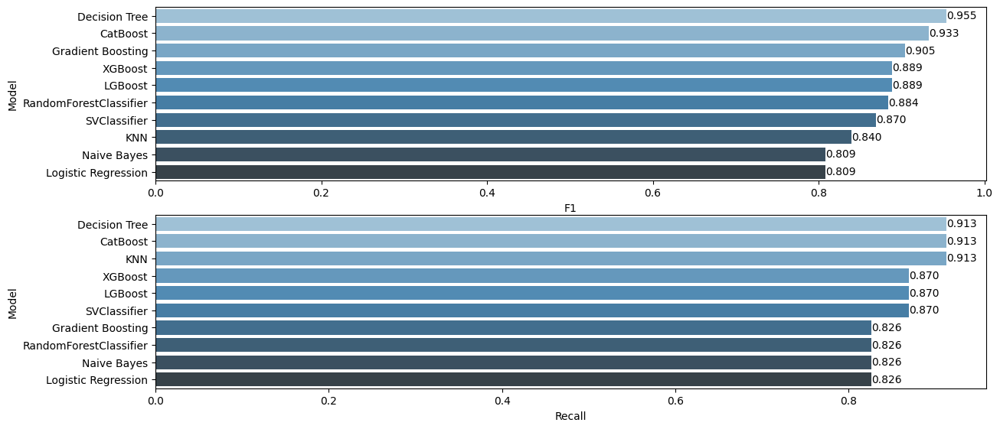

In [64]:
compare = pd.DataFrame({"Model": ["Naive Bayes", "Decision Tree", "KNN", "Logistic Regression", "SVClassifier", "RandomForestClassifier" ,"Gradient Boosting",
                                 "XGBoost", "LGBoost" , "CatBoost"],
                        "F1": [nb_f1, dt_f1, knn_f1, log_f1, svc_f1, rf_f1 , gb_f1, xgb_f1, lgb_f1 , cb_f1],
                        "Recall": [nb_recall, dt_recall, knn_recall, log_recall, svc_recall, rf_recall, gb_recall, xgb_recall, lgb_recall , cb_recall],
                        # "ROC_AUC": [log_auc, knn_auc, svc_auc, dt_auc, rf_auc, ada_auc, gb_auc, xgb_auc]
                        })

def labels(ax):
    for p in ax.patches:
        width = p.get_width()                        # get bar length
        ax.text(width,                               # set the text at 1 unit right of the bar
                p.get_y() + p.get_height() / 2,      # get Y coordinate + X coordinate / 2
                '{:1.3f}'.format(width),             # set variable to display, 2 decimals
                ha = 'left',                         # horizontal alignment
                va = 'center')                       # vertical alignment
    
plt.figure(figsize=(14,10))
plt.subplot(311)
compare = compare.sort_values(by="F1", ascending=False)
ax=sns.barplot(x="F1", y="Model", data=compare, palette="Blues_d")
labels(ax)

plt.subplot(312)
compare = compare.sort_values(by="Recall", ascending=False)
ax=sns.barplot(x="Recall", y="Model", data=compare, palette="Blues_d")
labels(ax)

# plt.subplot(313)
# compare = compare.sort_values(by="ROC_AUC", ascending=False)
# ax=sns.barplot(x="ROC_AUC", y="Model", data=compare, palette="Blues_d")
# labels(ax)
# plt.show()

In [65]:
# Without SMOTE, totally imbalanced data XGBoost was best.
# With SMOTE , CatBoost is the best.
# With ADASYN , CatBoost best again.
# With SMOTE and new hyper parameters XGBoost is the best.
# Even we use SMOTE our Recall score can't improve more than 0.889

In [66]:
# Done